<a href="https://colab.research.google.com/github/nidhi-906/Morla/blob/main/circle_fitting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

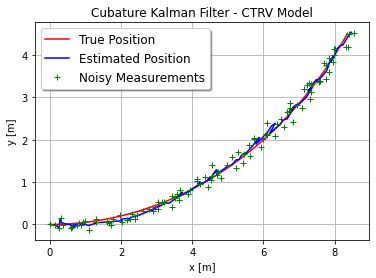

CKF Over


In [2]:

import math
import matplotlib.pyplot as plt
import numpy as np
from scipy.linalg import sqrtm


dt = 0.1
N = 100

show_final = 1
show_animation = 0
show_ellipse = 0


z_noise = np.array([[0.1, 0.0, 0.0, 0.0],               # x position    [m]
                    [0.0, 0.1, 0.0, 0.0],               # y position    [m]
                    [0.0, 0.0, 0.1, 0.0],               # velocity      [m/s]
                    [0.0, 0.0, 0.0, 0.1]])              # yaw rate      [rad/s]


x_0 = np.array([[0.0],                                  # x position    [m]
                [0.0],                                  # y position    [m]
                [0.0],                                  # yaw           [rad]
                [1.0],                                  # velocity      [m/s]
                [0.1]])                                 # yaw rate      [rad/s]


p_0 = np.array([[1e-3, 0.0, 0.0, 0.0, 0.0],
                [0.0, 1e-3, 0.0, 0.0, 0.0],
                [0.0, 0.0, 1.0, 0.0, 0.0],
                [0.0, 0.0, 0.0, 1.0, 0.0],
                [0.0, 0.0, 0.0, 0.0, 1.0]])


q = np.array([[1e-11, 0.0,    0.0,               0.0, 0.0],
              [0.0, 1e-11,    0.0,               0.0, 0.0],
              [0.0, 0.0,    np.deg2rad(1e-4),   0.0, 0.0],
              [0.0, 0.0,    0.0,               1e-4, 0.0],
              [0.0, 0.0,    0.0,                0.0, np.deg2rad(1e-4)]])


hx = np.array([[1.0, 0.0, 0.0, 0.0, 0.0],
               [0.0, 1.0, 0.0, 0.0, 0.0],
               [0.0, 0.0, 0.0, 1.0, 0.0],
               [0.0, 0.0, 0.0, 0.0, 1.0]])


r = np.array([[0.015, 0.0, 0.0, 0.0],
              [0.0, 0.010, 0.0, 0.0],
              [0.0, 0.0, 0.1, 0.0],
              [0.0, 0.0, 0.0, 0.01]])**2


def cubature_kalman_filter(x_est, p_est, z):
    x_pred, p_pred = cubature_prediction(x_est, p_est)
    x_upd, p_upd = cubature_update(x_pred, p_pred, z)
    return x_upd, p_upd


def f(x):
    
    x[0] = x[0] + (x[3]/x[4]) * (np.sin(x[4] * dt + x[2]) - np.sin(x[2]))
    x[1] = x[1] + (x[3]/x[4]) * (- np.cos(x[4] * dt + x[2]) + np.cos(x[2]))
    x[2] = x[2] + x[4] * dt
    x[3] = x[3]
    x[4] = x[4]
    return x


def h(x):
   
    x = hx @ x
    return x


def sigma(x, p):
    
    n = np.shape(x)[0]
    SP = np.zeros((n, 2*n))
    W = np.zeros((1, 2*n))
    for i in range(n):
        SD = sqrtm(p)
        SP[:, i] = (x + (math.sqrt(n) * SD[:, i]).reshape((n, 1))).flatten()
        SP[:, i+n] = (x - (math.sqrt(n) * SD[:, i]).reshape((n, 1))).flatten()
        W[:, i] = 1/(2*n)
        W[:, i+n] = W[:, i]
    return SP, W


def cubature_prediction(x_pred, p_pred):
    n = np.shape(x_pred)[0]
    [SP, W] = sigma(x_pred, p_pred)
    x_pred = np.zeros((n, 1))
    p_pred = q
    for i in range(2*n):
        x_pred = x_pred + (f(SP[:, i]).reshape((n, 1)) * W[0, i])
    for i in range(2*n):
        p_step = (f(SP[:, i]).reshape((n, 1)) - x_pred)
        p_pred = p_pred + (p_step @ p_step.T * W[0, i])
    return x_pred, p_pred


def cubature_update(x_pred, p_pred, z):
    n = np.shape(x_pred)[0]
    m = np.shape(z)[0]
    [SP, W] = sigma(x_pred, p_pred)
    y_k = np.zeros((m, 1))
    P_xy = np.zeros((n, m))
    s = r
    for i in range(2*n):
        y_k = y_k + (h(SP[:, i]).reshape((m, 1)) * W[0, i])
    for i in range(2*n):
        p_step = (h(SP[:, i]).reshape((m, 1)) - y_k)
        P_xy = P_xy + ((SP[:, i]).reshape((n, 1)) -
                       x_pred) @ p_step.T * W[0, i]
        s = s + p_step @ p_step.T * W[0, i]
    x_pred = x_pred + P_xy @ np.linalg.pinv(s) @ (z - y_k)
    p_pred = p_pred - P_xy @ np.linalg.pinv(s) @ P_xy.T
    return x_pred, p_pred


def generate_measurement(x_true):
    gz = hx @ x_true
    z = gz + z_noise @ np.random.randn(4, 1)
    return z


def plot_animation(i, x_true_cat, x_est_cat, z):
    if i == 0:
        plt.plot(x_true_cat[0], x_true_cat[1], '.r')
        plt.plot(x_est_cat[0], x_est_cat[1], '.b')
    else:
        plt.plot(x_true_cat[0:, 0], x_true_cat[0:, 1], 'r')
        plt.plot(x_est_cat[0:, 0], x_est_cat[0:, 1], 'b')
    plt.plot(z[0], z[1], '+g')
    plt.grid(True)
    plt.pause(0.001)


def plot_ellipse(x_est, p_est):
    phi = np.linspace(0, 2 * math.pi, 100)
    p_ellipse = np.array(
        [[p_est[0, 0], p_est[0, 1]], [p_est[1, 0], p_est[1, 1]]])
    x0 = 3 * sqrtm(p_ellipse)
    xy_1 = np.array([])
    xy_2 = np.array([])
    for i in range(100):
        arr = np.array([[math.sin(phi[i])], [math.cos(phi[i])]])
        arr = x0 @ arr
        xy_1 = np.hstack([xy_1, arr[0]])
        xy_2 = np.hstack([xy_2, arr[1]])
    plt.plot(xy_1 + x_est[0], xy_2 + x_est[1], 'r')
    plt.pause(0.00001)


def plot_final(x_true_cat, x_est_cat, z_cat):
    fig = plt.figure()
    subplot = fig.add_subplot(111)
    subplot.plot(x_true_cat[0:, 0], x_true_cat[0:, 1],
                 'r', label='True Position')
    subplot.plot(x_est_cat[0:, 0], x_est_cat[0:, 1],
                 'b', label='Estimated Position')
    subplot.plot(z_cat[0:, 0], z_cat[0:, 1], '+g', label='Noisy Measurements')
    subplot.set_xlabel('x [m]')
    subplot.set_ylabel('y [m]')
    subplot.set_title('Cubature Kalman Filter - CTRV Model')
    subplot.legend(loc='upper left', shadow=True, fontsize='large')
    plt.grid(True)
    plt.show()


def main():
   
    x_est = x_0
    p_est = p_0
    x_true = x_0
    x_true_cat = np.array([x_0[0, 0], x_0[1, 0]])
    x_est_cat = np.array([x_0[0, 0], x_0[1, 0]])
    z_cat = np.array([x_0[0, 0], x_0[1, 0]])
    for i in range(N):
        x_true = f(x_true)
        z = generate_measurement(x_true)
        if i == (N - 1) and show_final == 1:
            show_final_flag = 1
        else:
            show_final_flag = 0
        if show_animation == 1:
            plot_animation(i, x_true_cat, x_est_cat, z)
        if show_ellipse == 1:
            plot_ellipse(x_est[0:2], p_est)
        if show_final_flag == 1:
            plot_final(x_true_cat, x_est_cat, z_cat)
        x_est, p_est = cubature_kalman_filter(x_est, p_est, z)
        x_true_cat = np.vstack((x_true_cat, x_true[0:2].T))
        x_est_cat = np.vstack((x_est_cat, x_est[0:2].T))
        z_cat = np.vstack((z_cat, z[0:2].T))
    print('CKF Over')


if __name__ == '__main__':
    main()

In [4]:
import numpy as np
from scipy.spatial.transform import Rotation as Rot


def rot_mat_2d(angle):
    
    return Rot.from_euler('z', angle).as_matrix()[0:2, 0:2]


def angle_mod(x, zero_2_2pi=False, degree=False):
    """
    Angle modulo operation
    Default angle modulo range is [-pi, pi)
    Parameters
    ----------
    x : float or array_like
        A angle or an array of angles. This array is flattened for
        the calculation. When an angle is provided, a float angle is returned.
    zero_2_2pi : bool, optional
        Change angle modulo range to [0, 2pi)
        Default is False.
    degree : bool, optional
        If True, then the given angles are assumed to be in degrees.
        Default is False.
    Returns
    -------
    ret : float or ndarray
        an angle or an array of modulated angle.
    Examples
    --------
    >>> angle_mod(-4.0)
    2.28318531
    >>> angle_mod([-4.0])
    np.array(2.28318531)
    >>> angle_mod([-150.0, 190.0, 350], degree=True)
    array([-150., -170.,  -10.])
    >>> angle_mod(-60.0, zero_2_2pi=True, degree=True)
    array([300.])
    """
    if isinstance(x, float):
        is_float = True
    else:
        is_float = False

    x = np.asarray(x).flatten()
    if degree:
        x = np.deg2rad(x)

    if zero_2_2pi:
        mod_angle = x % (2 * np.pi)
    else:
        mod_angle = (x + np.pi) % (2 * np.pi) - np.pi

    if degree:
        mod_angle = np.rad2deg(mod_angle)

    if is_float:
        return mod_angle.item()
    else:
        return mod_angle

In [ ]:

import math
import random

import matplotlib.pyplot as plt
import numpy as np

show_animation = True


class RRT:
    """
    Class for RRT planning
    """

    class Node:
        """
        RRT Node
        """

        def __init__(self, x, y):
            self.x = x
            self.y = y
            self.path_x = []
            self.path_y = []
            self.parent = None

    class AreaBounds:

        def __init__(self, area):
            self.xmin = float(area[0])
            self.xmax = float(area[1])
            self.ymin = float(area[2])
            self.ymax = float(area[3])


    def __init__(self,
                 start,
                 goal,
                 obstacle_list,
                 rand_area,
                 expand_dis=3.0,
                 path_resolution=0.5,
                 goal_sample_rate=5,
                 max_iter=500,
                 play_area=None,
                 robot_radius=0.0,
                 ):
        """
        Setting Parameter
        start:Start Position [x,y]
        goal:Goal Position [x,y]
        obstacleList:obstacle Positions [[x,y,size],...]
        randArea:Random Sampling Area [min,max]
        play_area:stay inside this area [xmin,xmax,ymin,ymax]
        robot_radius: robot body modeled as circle with given radius
        """
        self.start = self.Node(start[0], start[1])
        self.end = self.Node(goal[0], goal[1])
        self.min_rand = rand_area[0]
        self.max_rand = rand_area[1]
        if play_area is not None:
            self.play_area = self.AreaBounds(play_area)
        else:
            self.play_area = None
        self.expand_dis = expand_dis
        self.path_resolution = path_resolution
        self.goal_sample_rate = goal_sample_rate
        self.max_iter = max_iter
        self.obstacle_list = obstacle_list
        self.node_list = []
        self.robot_radius = robot_radius

    def planning(self, animation=True):
        """
        rrt path planning
        animation: flag for animation on or off
        """

        self.node_list = [self.start]
        for i in range(self.max_iter):
            rnd_node = self.get_random_node()
            nearest_ind = self.get_nearest_node_index(self.node_list, rnd_node)
            nearest_node = self.node_list[nearest_ind]

            new_node = self.steer(nearest_node, rnd_node, self.expand_dis)

            if self.check_if_outside_play_area(new_node, self.play_area) and \
               self.check_collision(
                   new_node, self.obstacle_list, self.robot_radius):
                self.node_list.append(new_node)

            if animation and i % 5 == 0:
                self.draw_graph(rnd_node)

            if self.calc_dist_to_goal(self.node_list[-1].x,
                                      self.node_list[-1].y) <= self.expand_dis:
                final_node = self.steer(self.node_list[-1], self.end,
                                        self.expand_dis)
                if self.check_collision(
                        final_node, self.obstacle_list, self.robot_radius):
                    return self.generate_final_course(len(self.node_list) - 1)

            if animation and i % 5:
                self.draw_graph(rnd_node)

        return None  # cannot find path

    def steer(self, from_node, to_node, extend_length=float("inf")):

        new_node = self.Node(from_node.x, from_node.y)
        d, theta = self.calc_distance_and_angle(new_node, to_node)

        new_node.path_x = [new_node.x]
        new_node.path_y = [new_node.y]

        if extend_length > d:
            extend_length = d

        n_expand = math.floor(extend_length / self.path_resolution)

        for _ in range(n_expand):
            new_node.x += self.path_resolution * math.cos(theta)
            new_node.y += self.path_resolution * math.sin(theta)
            new_node.path_x.append(new_node.x)
            new_node.path_y.append(new_node.y)

        d, _ = self.calc_distance_and_angle(new_node, to_node)
        if d <= self.path_resolution:
            new_node.path_x.append(to_node.x)
            new_node.path_y.append(to_node.y)
            new_node.x = to_node.x
            new_node.y = to_node.y

        new_node.parent = from_node

        return new_node

    def generate_final_course(self, goal_ind):
        path = [[self.end.x, self.end.y]]
        node = self.node_list[goal_ind]
        while node.parent is not None:
            path.append([node.x, node.y])
            node = node.parent
        path.append([node.x, node.y])

        return path

    def calc_dist_to_goal(self, x, y):
        dx = x - self.end.x
        dy = y - self.end.y
        return math.hypot(dx, dy)

    def get_random_node(self):
        if random.randint(0, 100) > self.goal_sample_rate:
            rnd = self.Node(
                random.uniform(self.min_rand, self.max_rand),
                random.uniform(self.min_rand, self.max_rand))
        else:  # goal point sampling
            rnd = self.Node(self.end.x, self.end.y)
        return rnd

    def draw_graph(self, rnd=None):
        plt.clf()
        # for stopping simulation with the esc key.
        plt.gcf().canvas.mpl_connect(
            'key_release_event',
            lambda event: [exit(0) if event.key == 'escape' else None])
        if rnd is not None:
            plt.plot(rnd.x, rnd.y, "^k")
            if self.robot_radius > 0.0:
                self.plot_circle(rnd.x, rnd.y, self.robot_radius, '-r')
        for node in self.node_list:
            if node.parent:
                plt.plot(node.path_x, node.path_y, "-g")

        for (ox, oy, size) in self.obstacle_list:
            self.plot_circle(ox, oy, size)

        if self.play_area is not None:
            plt.plot([self.play_area.xmin, self.play_area.xmax,
                      self.play_area.xmax, self.play_area.xmin,
                      self.play_area.xmin],
                     [self.play_area.ymin, self.play_area.ymin,
                      self.play_area.ymax, self.play_area.ymax,
                      self.play_area.ymin],
                     "-k")

        plt.plot(self.start.x, self.start.y, "xr")
        plt.plot(self.end.x, self.end.y, "xr")
        plt.axis("equal")
        plt.axis([-2, 15, -2, 15])
        plt.grid(True)
        plt.pause(0.01)

    @staticmethod
    def plot_circle(x, y, size, color="-b"):  # pragma: no cover
        deg = list(range(0, 360, 5))
        deg.append(0)
        xl = [x + size * math.cos(np.deg2rad(d)) for d in deg]
        yl = [y + size * math.sin(np.deg2rad(d)) for d in deg]
        plt.plot(xl, yl, color)

    @staticmethod
    def get_nearest_node_index(node_list, rnd_node):
        dlist = [(node.x - rnd_node.x)**2 + (node.y - rnd_node.y)**2
                 for node in node_list]
        minind = dlist.index(min(dlist))

        return minind

    @staticmethod
    def check_if_outside_play_area(node, play_area):

        if play_area is None:
            return True  # no play_area was defined, every pos should be ok

        if node.x < play_area.xmin or node.x > play_area.xmax or \
           node.y < play_area.ymin or node.y > play_area.ymax:
            return False  # outside - bad
        else:
            return True  # inside - ok

    @staticmethod
    def check_collision(node, obstacleList, robot_radius):

        if node is None:
            return False

        for (ox, oy, size) in obstacleList:
            dx_list = [ox - x for x in node.path_x]
            dy_list = [oy - y for y in node.path_y]
            d_list = [dx * dx + dy * dy for (dx, dy) in zip(dx_list, dy_list)]

            if min(d_list) <= (size+robot_radius)**2:
                return False  # collision

        return True  # safe

    @staticmethod
    def calc_distance_and_angle(from_node, to_node):
        dx = to_node.x - from_node.x
        dy = to_node.y - from_node.y
        d = math.hypot(dx, dy)
        theta = math.atan2(dy, dx)
        return d, theta


def main(gx=6.0, gy=10.0):
   

    # ====Search Path with RRT====
    obstacleList = [(5, 5, 1), (3, 6, 2), (3, 8, 2), (3, 10, 2), (7, 5, 2),
                    (9, 5, 2), (8, 10, 1)]  # [x, y, radius]
    # Set Initial parameters
    rrt = RRT(
        start=[0, 0],
        goal=[gx, gy],
        rand_area=[-2, 15],
        obstacle_list=obstacleList,
        # play_area=[0, 10, 0, 14]
        robot_radius=0.8
        )
    path = rrt.planning(animation=show_animation)

    if path is None:
        print("Cannot find path")
    else:
        print("found path!!")

        # Draw final path
        if show_animation:
            rrt.draw_graph()
            plt.plot([x for (x, y) in path], [y for (x, y) in path], '-r')
            plt.grid(True)
            plt.pause(0.01)  # Need for Mac
            plt.show()


if __name__ == '__main__':
    main()

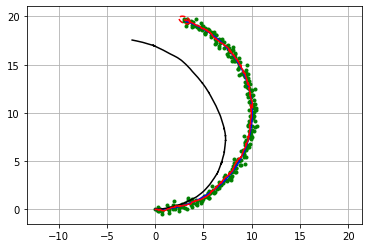

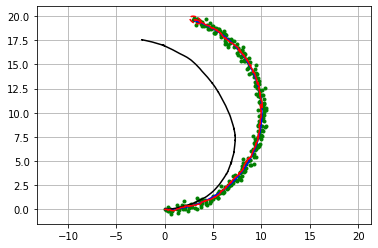

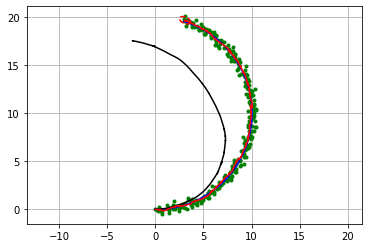

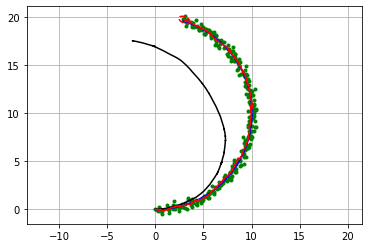

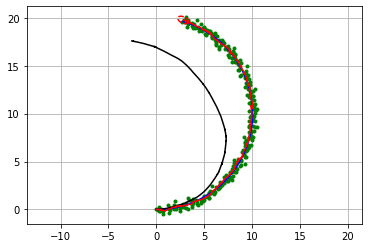

...

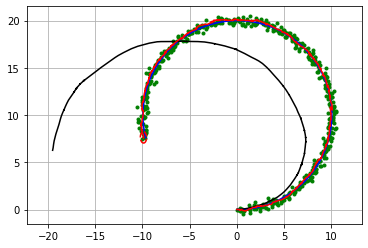

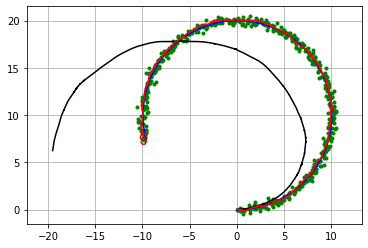

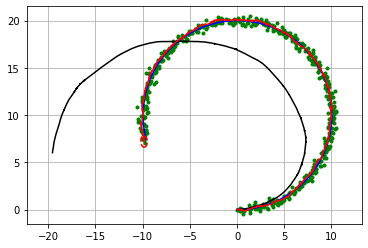

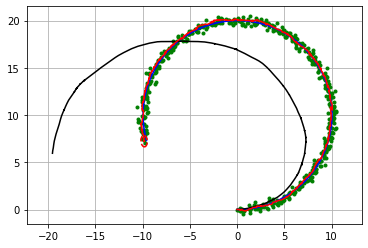

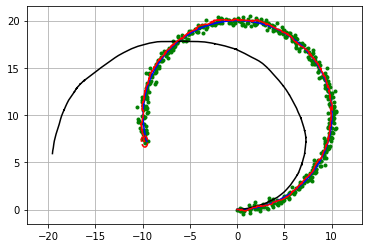

In [10]:
import numpy as np 
import pathlib
#sys.path.append(str(pathlib.Path(__file__).parent.parent.parent))

import math
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.transform import Rotation as Rot


def rot_mat_2d(angle):
  
  
    return Rot.from_euler('z', angle).as_matrix()[0:2, 0:2]


def angle_mod(x, zero_2_2pi=False, degree=False):
  
    if isinstance(x, float):
        is_float = True
    else:
        is_float = False

    x = np.asarray(x).flatten()
    if degree:
        x = np.deg2rad(x)

    if zero_2_2pi:
        mod_angle = x % (2 * np.pi)
    else:
        mod_angle = (x + np.pi) % (2 * np.pi) - np.pi

    if degree:
        mod_angle = np.rad2deg(mod_angle)

    if is_float:
        return mod_angle.item()
    else:
        return mod_angle


Q = np.diag([
    0.1,  # variance of location on x-axis
    0.1,  # variance of location on y-axis
    np.deg2rad(1.0),  # variance of yaw angle
    1.0  # variance of velocity
]) ** 2  # predict state covariance
R = np.diag([1.0, 1.0]) ** 2  # Observation x,y position covariance

#  Simulation parameter
INPUT_NOISE = np.diag([1.0, np.deg2rad(30.0)]) ** 2
GPS_NOISE = np.diag([0.5, 0.5]) ** 2

DT = 0.1  # time tick [s]
SIM_TIME = 50.0  # simulation time [s]

show_animation = True


def calc_input():
    v = 1.0  # [m/s]
    yawrate = 0.1  # [rad/s]
    u = np.array([[v], [yawrate]])
    return u


def observation(xTrue, xd, u):
    xTrue = motion_model(xTrue, u)

    # add noise to gps x-y
    z = observation_model(xTrue) + GPS_NOISE @ np.random.randn(2, 1)

    # add noise to input
    ud = u + INPUT_NOISE @ np.random.randn(2, 1)

    xd = motion_model(xd, ud)

    return xTrue, z, xd, ud


def motion_model(x, u):
    F = np.array([[1.0, 0, 0, 0],
                  [0, 1.0, 0, 0],
                  [0, 0, 1.0, 0],
                  [0, 0, 0, 0]])

    B = np.array([[DT * math.cos(x[2, 0]), 0],
                  [DT * math.sin(x[2, 0]), 0],
                  [0.0, DT],
                  [1.0, 0.0]])

    x = F @ x + B @ u

    return x


def observation_model(x):
    H = np.array([
        [1, 0, 0, 0],
        [0, 1, 0, 0]
    ])

    z = H @ x

    return z


def jacob_f(x, u):
    """
    Jacobian of Motion Model
    motion model
    x_{t+1} = x_t+v*dt*cos(yaw)
    y_{t+1} = y_t+v*dt*sin(yaw)
    yaw_{t+1} = yaw_t+omega*dt
    v_{t+1} = v{t}
    so
    dx/dyaw = -v*dt*sin(yaw)
    dx/dv = dt*cos(yaw)
    dy/dyaw = v*dt*cos(yaw)
    dy/dv = dt*sin(yaw)
    """
    yaw = x[2, 0]
    v = u[0, 0]
    jF = np.array([
        [1.0, 0.0, -DT * v * math.sin(yaw), DT * math.cos(yaw)],
        [0.0, 1.0, DT * v * math.cos(yaw), DT * math.sin(yaw)],
        [0.0, 0.0, 1.0, 0.0],
        [0.0, 0.0, 0.0, 1.0]])

    return jF


def jacob_h():
    # Jacobian of Observation Model
    jH = np.array([
        [1, 0, 0, 0],
        [0, 1, 0, 0]
    ])

    return jH


def ekf_estimation(xEst, PEst, z, u):
    #  Predict
    xPred = motion_model(xEst, u)
    jF = jacob_f(xEst, u)
    PPred = jF @ PEst @ jF.T + Q

    #  Update
    jH = jacob_h()
    zPred = observation_model(xPred)
    y = z - zPred
    S = jH @ PPred @ jH.T + R
    K = PPred @ jH.T @ np.linalg.inv(S)
    xEst = xPred + K @ y
    PEst = (np.eye(len(xEst)) - K @ jH) @ PPred
    return xEst, PEst


def plot_covariance_ellipse(xEst, PEst):  # pragma: no cover
    Pxy = PEst[0:2, 0:2]
    eigval, eigvec = np.linalg.eig(Pxy)

    if eigval[0] >= eigval[1]:
        bigind = 0
        smallind = 1
    else:
        bigind = 1
        smallind = 0

    t = np.arange(0, 2 * math.pi + 0.1, 0.1)
    a = math.sqrt(eigval[bigind])
    b = math.sqrt(eigval[smallind])
    x = [a * math.cos(it) for it in t]
    y = [b * math.sin(it) for it in t]
    angle = math.atan2(eigvec[1, bigind], eigvec[0, bigind])
    fx = rot_mat_2d(angle) @ (np.array([x, y]))
    px = np.array(fx[0, :] + xEst[0, 0]).flatten()
    py = np.array(fx[1, :] + xEst[1, 0]).flatten()
    plt.plot(px, py, "--r")


def main():
    

    time = 0.0

    # State Vector [x y yaw v]'
    xEst = np.zeros((4, 1))
    xTrue = np.zeros((4, 1))
    PEst = np.eye(4)

    xDR = np.zeros((4, 1))  # Dead reckoning

    # history
    hxEst = xEst
    hxTrue = xTrue
    hxDR = xTrue
    hz = np.zeros((2, 1))

    while SIM_TIME >= time:
        time += DT
        u = calc_input()

        xTrue, z, xDR, ud = observation(xTrue, xDR, u)

        xEst, PEst = ekf_estimation(xEst, PEst, z, ud)

        # store data history
        hxEst = np.hstack((hxEst, xEst))
        hxDR = np.hstack((hxDR, xDR))
        hxTrue = np.hstack((hxTrue, xTrue))
        hz = np.hstack((hz, z))

        if show_animation:
            plt.cla()
            # for stopping simulation with the esc key.
            plt.gcf().canvas.mpl_connect('key_release_event',
                    lambda event: [exit(0) if event.key == 'escape' else None])
            plt.plot(hz[0, :], hz[1, :], ".g")
            plt.plot(hxTrue[0, :].flatten(),
                     hxTrue[1, :].flatten(), "-b")
            plt.plot(hxDR[0, :].flatten(),
                     hxDR[1, :].flatten(), "-k")
            plt.plot(hxEst[0, :].flatten(),
                     hxEst[1, :].flatten(), "-r")
            plot_covariance_ellipse(xEst, PEst)
            plt.axis("equal")
            plt.grid(True)
            plt.pause(0.001)


if __name__ == '__main__':
    main()

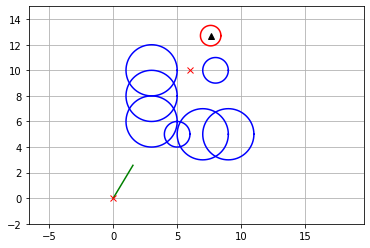

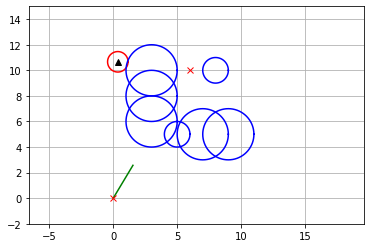

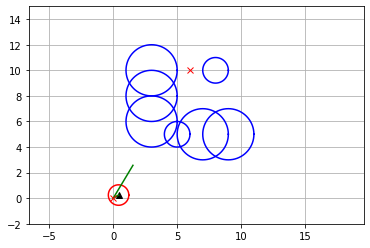

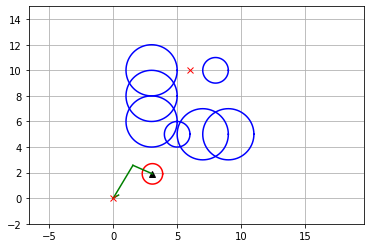

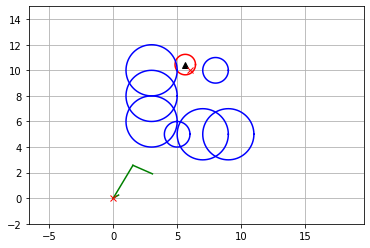

...

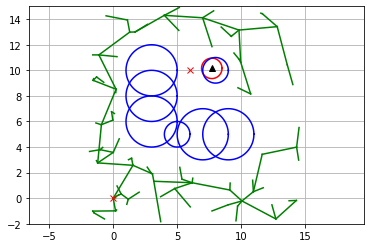

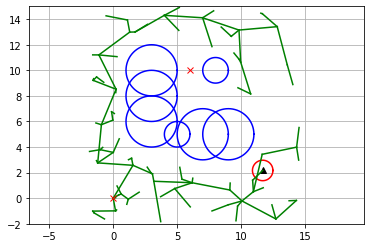

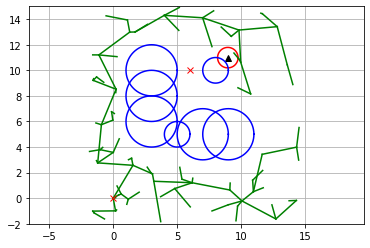

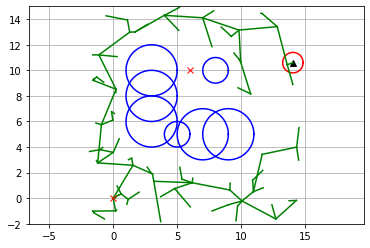

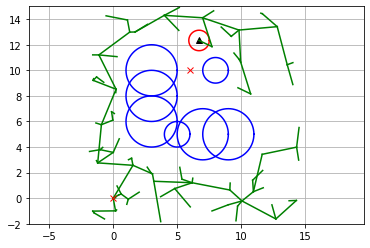

found path!!


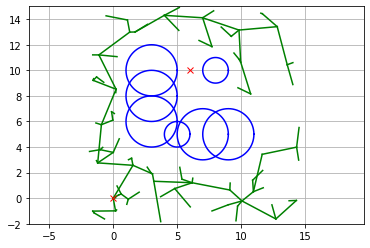

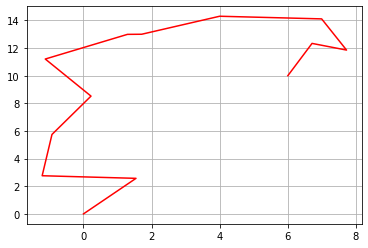

In [11]:

import math
import random

import matplotlib.pyplot as plt
import numpy as np

show_animation = True


class RRT:
    """
    Class for RRT planning
    """

    class Node:
        """
        RRT Node
        """

        def __init__(self, x, y):
            self.x = x
            self.y = y
            self.path_x = []
            self.path_y = []
            self.parent = None

    class AreaBounds:

        def __init__(self, area):
            self.xmin = float(area[0])
            self.xmax = float(area[1])
            self.ymin = float(area[2])
            self.ymax = float(area[3])


    def __init__(self,
                 start,
                 goal,
                 obstacle_list,
                 rand_area,
                 expand_dis=3.0,
                 path_resolution=0.5,
                 goal_sample_rate=5,
                 max_iter=500,
                 play_area=None,
                 robot_radius=0.0,
                 ):
        """
        Setting Parameter
        start:Start Position [x,y]
        goal:Goal Position [x,y]
        obstacleList:obstacle Positions [[x,y,size],...]
        randArea:Random Sampling Area [min,max]
        play_area:stay inside this area [xmin,xmax,ymin,ymax]
        robot_radius: robot body modeled as circle with given radius
        """
        self.start = self.Node(start[0], start[1])
        self.end = self.Node(goal[0], goal[1])
        self.min_rand = rand_area[0]
        self.max_rand = rand_area[1]
        if play_area is not None:
            self.play_area = self.AreaBounds(play_area)
        else:
            self.play_area = None
        self.expand_dis = expand_dis
        self.path_resolution = path_resolution
        self.goal_sample_rate = goal_sample_rate
        self.max_iter = max_iter
        self.obstacle_list = obstacle_list
        self.node_list = []
        self.robot_radius = robot_radius

    def planning(self, animation=True):
        """
        rrt path planning
        animation: flag for animation on or off
        """

        self.node_list = [self.start]
        for i in range(self.max_iter):
            rnd_node = self.get_random_node()
            nearest_ind = self.get_nearest_node_index(self.node_list, rnd_node)
            nearest_node = self.node_list[nearest_ind]

            new_node = self.steer(nearest_node, rnd_node, self.expand_dis)

            if self.check_if_outside_play_area(new_node, self.play_area) and \
               self.check_collision(
                   new_node, self.obstacle_list, self.robot_radius):
                self.node_list.append(new_node)

            if animation and i % 5 == 0:
                self.draw_graph(rnd_node)

            if self.calc_dist_to_goal(self.node_list[-1].x,
                                      self.node_list[-1].y) <= self.expand_dis:
                final_node = self.steer(self.node_list[-1], self.end,
                                        self.expand_dis)
                if self.check_collision(
                        final_node, self.obstacle_list, self.robot_radius):
                    return self.generate_final_course(len(self.node_list) - 1)

            if animation and i % 5:
                self.draw_graph(rnd_node)

        return None  # cannot find path

    def steer(self, from_node, to_node, extend_length=float("inf")):

        new_node = self.Node(from_node.x, from_node.y)
        d, theta = self.calc_distance_and_angle(new_node, to_node)

        new_node.path_x = [new_node.x]
        new_node.path_y = [new_node.y]

        if extend_length > d:
            extend_length = d

        n_expand = math.floor(extend_length / self.path_resolution)

        for _ in range(n_expand):
            new_node.x += self.path_resolution * math.cos(theta)
            new_node.y += self.path_resolution * math.sin(theta)
            new_node.path_x.append(new_node.x)
            new_node.path_y.append(new_node.y)

        d, _ = self.calc_distance_and_angle(new_node, to_node)
        if d <= self.path_resolution:
            new_node.path_x.append(to_node.x)
            new_node.path_y.append(to_node.y)
            new_node.x = to_node.x
            new_node.y = to_node.y

        new_node.parent = from_node

        return new_node

    def generate_final_course(self, goal_ind):
        path = [[self.end.x, self.end.y]]
        node = self.node_list[goal_ind]
        while node.parent is not None:
            path.append([node.x, node.y])
            node = node.parent
        path.append([node.x, node.y])

        return path

    def calc_dist_to_goal(self, x, y):
        dx = x - self.end.x
        dy = y - self.end.y
        return math.hypot(dx, dy)

    def get_random_node(self):
        if random.randint(0, 100) > self.goal_sample_rate:
            rnd = self.Node(
                random.uniform(self.min_rand, self.max_rand),
                random.uniform(self.min_rand, self.max_rand))
        else:  # goal point sampling
            rnd = self.Node(self.end.x, self.end.y)
        return rnd

    def draw_graph(self, rnd=None):
        plt.clf()
        # for stopping simulation with the esc key.
        plt.gcf().canvas.mpl_connect(
            'key_release_event',
            lambda event: [exit(0) if event.key == 'escape' else None])
        if rnd is not None:
            plt.plot(rnd.x, rnd.y, "^k")
            if self.robot_radius > 0.0:
                self.plot_circle(rnd.x, rnd.y, self.robot_radius, '-r')
        for node in self.node_list:
            if node.parent:
                plt.plot(node.path_x, node.path_y, "-g")

        for (ox, oy, size) in self.obstacle_list:
            self.plot_circle(ox, oy, size)

        if self.play_area is not None:
            plt.plot([self.play_area.xmin, self.play_area.xmax,
                      self.play_area.xmax, self.play_area.xmin,
                      self.play_area.xmin],
                     [self.play_area.ymin, self.play_area.ymin,
                      self.play_area.ymax, self.play_area.ymax,
                      self.play_area.ymin],
                     "-k")

        plt.plot(self.start.x, self.start.y, "xr")
        plt.plot(self.end.x, self.end.y, "xr")
        plt.axis("equal")
        plt.axis([-2, 15, -2, 15])
        plt.grid(True)
        plt.pause(0.01)

    @staticmethod
    def plot_circle(x, y, size, color="-b"):  # pragma: no cover
        deg = list(range(0, 360, 5))
        deg.append(0)
        xl = [x + size * math.cos(np.deg2rad(d)) for d in deg]
        yl = [y + size * math.sin(np.deg2rad(d)) for d in deg]
        plt.plot(xl, yl, color)

    @staticmethod
    def get_nearest_node_index(node_list, rnd_node):
        dlist = [(node.x - rnd_node.x)**2 + (node.y - rnd_node.y)**2
                 for node in node_list]
        minind = dlist.index(min(dlist))

        return minind

    @staticmethod
    def check_if_outside_play_area(node, play_area):

        if play_area is None:
            return True  # no play_area was defined, every pos should be ok

        if node.x < play_area.xmin or node.x > play_area.xmax or \
           node.y < play_area.ymin or node.y > play_area.ymax:
            return False  # outside - bad
        else:
            return True  # inside - ok

    @staticmethod
    def check_collision(node, obstacleList, robot_radius):

        if node is None:
            return False

        for (ox, oy, size) in obstacleList:
            dx_list = [ox - x for x in node.path_x]
            dy_list = [oy - y for y in node.path_y]
            d_list = [dx * dx + dy * dy for (dx, dy) in zip(dx_list, dy_list)]

            if min(d_list) <= (size+robot_radius)**2:
                return False  # collision

        return True  # safe

    @staticmethod
    def calc_distance_and_angle(from_node, to_node):
        dx = to_node.x - from_node.x
        dy = to_node.y - from_node.y
        d = math.hypot(dx, dy)
        theta = math.atan2(dy, dx)
        return d, theta


def main(gx=6.0, gy=10.0):
    #print("start " + __file__)

    # ====Search Path with RRT====
    obstacleList = [(5, 5, 1), (3, 6, 2), (3, 8, 2), (3, 10, 2), (7, 5, 2),
                    (9, 5, 2), (8, 10, 1)]  # [x, y, radius]
    # Set Initial parameters
    rrt = RRT(
        start=[0, 0],
        goal=[gx, gy],
        rand_area=[-2, 15],
        obstacle_list=obstacleList,
        # play_area=[0, 10, 0, 14]
        robot_radius=0.8
        )
    path = rrt.planning(animation=show_animation)

    if path is None:
        print("Cannot find path")
    else:
        print("found path!!")

        # Draw final path
        if show_animation:
            rrt.draw_graph()
            plt.plot([x for (x, y) in path], [y for (x, y) in path], '-r')
            plt.grid(True)
            plt.pause(0.01)  # Need for Mac
            plt.show()


if __name__ == '__main__':
    main()

In [ ]:
import math

import matplotlib.pyplot as plt

show_animation = True


class AStarPlanner:

    def __init__(self, ox, oy, resolution, rr):
        """
        Initialize grid map for a star planning
        ox: x position list of Obstacles [m]
        oy: y position list of Obstacles [m]
        resolution: grid resolution [m]
        rr: robot radius[m]
        """

        self.resolution = resolution
        self.rr = rr
        self.min_x, self.min_y = 0, 0
        self.max_x, self.max_y = 0, 0
        self.obstacle_map = None
        self.x_width, self.y_width = 0, 0
        self.motion = self.get_motion_model()
        self.calc_obstacle_map(ox, oy)

    class Node:
        def __init__(self, x, y, cost, parent_index):
            self.x = x  # index of grid
            self.y = y  # index of grid
            self.cost = cost
            self.parent_index = parent_index

        def __str__(self):
            return str(self.x) + "," + str(self.y) + "," + str(
                self.cost) + "," + str(self.parent_index)

    def planning(self, sx, sy, gx, gy):
        """
        A star path search
        input:
            s_x: start x position [m]
            s_y: start y position [m]
            gx: goal x position [m]
            gy: goal y position [m]
        output:
            rx: x position list of the final path
            ry: y position list of the final path
        """

        start_node = self.Node(self.calc_xy_index(sx, self.min_x),
                               self.calc_xy_index(sy, self.min_y), 0.0, -1)
        goal_node = self.Node(self.calc_xy_index(gx, self.min_x),
                              self.calc_xy_index(gy, self.min_y), 0.0, -1)

        open_set, closed_set = dict(), dict()
        open_set[self.calc_grid_index(start_node)] = start_node

        while 1:
            if len(open_set) == 0:
                print("Open set is empty..")
                break

            c_id = min(
                open_set,
                key=lambda o: open_set[o].cost + self.calc_heuristic(goal_node,
                                                                     open_set[
                                                                         o]))
            current = open_set[c_id]

            # show graph
            if show_animation:  # pragma: no cover
                plt.plot(self.calc_grid_position(current.x, self.min_x),
                         self.calc_grid_position(current.y, self.min_y), "xc")
                # for stopping simulation with the esc key.
                plt.gcf().canvas.mpl_connect('key_release_event',
                                             lambda event: [exit(
                                                 0) if event.key == 'escape' else None])
                if len(closed_set.keys()) % 10 == 0:
                    plt.pause(0.001)

            if current.x == goal_node.x and current.y == goal_node.y:
                print("Find goal")
                goal_node.parent_index = current.parent_index
                goal_node.cost = current.cost
                break

            # Remove the item from the open set
            del open_set[c_id]

            # Add it to the closed set
            closed_set[c_id] = current

            # expand_grid search grid based on motion model
            for i, _ in enumerate(self.motion):
                node = self.Node(current.x + self.motion[i][0],
                                 current.y + self.motion[i][1],
                                 current.cost + self.motion[i][2], c_id)
                n_id = self.calc_grid_index(node)

                # If the node is not safe, do nothing
                if not self.verify_node(node):
                    continue

                if n_id in closed_set:
                    continue

                if n_id not in open_set:
                    open_set[n_id] = node  # discovered a new node
                else:
                    if open_set[n_id].cost > node.cost:
                        # This path is the best until now. record it
                        open_set[n_id] = node

        rx, ry = self.calc_final_path(goal_node, closed_set)

        return rx, ry

    def calc_final_path(self, goal_node, closed_set):
        # generate final course
        rx, ry = [self.calc_grid_position(goal_node.x, self.min_x)], [
            self.calc_grid_position(goal_node.y, self.min_y)]
        parent_index = goal_node.parent_index
        while parent_index != -1:
            n = closed_set[parent_index]
            rx.append(self.calc_grid_position(n.x, self.min_x))
            ry.append(self.calc_grid_position(n.y, self.min_y))
            parent_index = n.parent_index

        return rx, ry

    @staticmethod
    def calc_heuristic(n1, n2):
        w = 1.0  # weight of heuristic
        d = w * math.hypot(n1.x - n2.x, n1.y - n2.y)
        return d

    def calc_grid_position(self, index, min_position):
        """
        calc grid position
        :param index:
        :param min_position:
        :return:
        """
        pos = index * self.resolution + min_position
        return pos

    def calc_xy_index(self, position, min_pos):
        return round((position - min_pos) / self.resolution)

    def calc_grid_index(self, node):
        return (node.y - self.min_y) * self.x_width + (node.x - self.min_x)

    def verify_node(self, node):
        px = self.calc_grid_position(node.x, self.min_x)
        py = self.calc_grid_position(node.y, self.min_y)

        if px < self.min_x:
            return False
        elif py < self.min_y:
            return False
        elif px >= self.max_x:
            return False
        elif py >= self.max_y:
            return False

        # collision check
        if self.obstacle_map[node.x][node.y]:
            return False

        return True

    def calc_obstacle_map(self, ox, oy):

        self.min_x = round(min(ox))
        self.min_y = round(min(oy))
        self.max_x = round(max(ox))
        self.max_y = round(max(oy))
        print("min_x:", self.min_x)
        print("min_y:", self.min_y)
        print("max_x:", self.max_x)
        print("max_y:", self.max_y)

        self.x_width = round((self.max_x - self.min_x) / self.resolution)
        self.y_width = round((self.max_y - self.min_y) / self.resolution)
        print("x_width:", self.x_width)
        print("y_width:", self.y_width)

        # obstacle map generation
        self.obstacle_map = [[False for _ in range(self.y_width)]
                             for _ in range(self.x_width)]
        for ix in range(self.x_width):
            x = self.calc_grid_position(ix, self.min_x)
            for iy in range(self.y_width):
                y = self.calc_grid_position(iy, self.min_y)
                for iox, ioy in zip(ox, oy):
                    d = math.hypot(iox - x, ioy - y)
                    if d <= self.rr:
                        self.obstacle_map[ix][iy] = True
                        break

    @staticmethod
    def get_motion_model():
        # dx, dy, cost
        motion = [[1, 0, 1],
                  [0, 1, 1],
                  [-1, 0, 1],
                  [0, -1, 1],
                  [-1, -1, math.sqrt(2)],
                  [-1, 1, math.sqrt(2)],
                  [1, -1, math.sqrt(2)],
                  [1, 1, math.sqrt(2)]]

        return motion


def main():
   # print(__file__ + " start!!")

    # start and goal position
    sx = 10.0  # [m]
    sy = 10.0  # [m]
    gx = 50.0  # [m]
    gy = 50.0  # [m]
    grid_size = 2.0  # [m]
    robot_radius = 1.0  # [m]

    # set obstacle positions
    ox, oy = [], []
    for i in range(-10, 60):
        ox.append(i)
        oy.append(-10.0)
    for i in range(-10, 60):
        ox.append(60.0)
        oy.append(i)
    for i in range(-10, 61):
        ox.append(i)
        oy.append(60.0)
    for i in range(-10, 61):
        ox.append(-10.0)
        oy.append(i)
    for i in range(-10, 40):
        ox.append(20.0)
        oy.append(i)
    for i in range(0, 40):
        ox.append(40.0)
        oy.append(60.0 - i)

    if show_animation:  # pragma: no cover
        plt.plot(ox, oy, ".k")
        plt.plot(sx, sy, "og")
        plt.plot(gx, gy, "xb")
        plt.grid(True)
        plt.axis("equal")

    a_star = AStarPlanner(ox, oy, grid_size, robot_radius)
    rx, ry = a_star.planning(sx, sy, gx, gy)

    if show_animation:  # pragma: no cover
        plt.plot(rx, ry, "-r")
        plt.pause(0.001)
        plt.show()


if __name__ == '__main__':
    main()

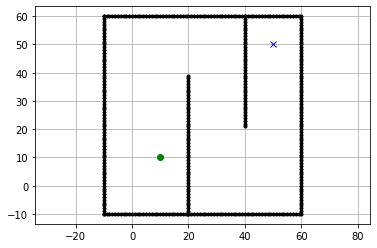

In [23]:
sx = 10.0  # [m]
sy = 10.0  # [m]
gx = 50.0  # [m]
gy = 50.0  # [m]
grid_size = 2.0  # [m]
robot_radius = 1.0  # [m]

# set obstacle positions
ox, oy = [], []
for i in range(-10, 60):
    ox.append(i)
    oy.append(-10.0)
for i in range(-10, 60):
    ox.append(60.0)
    oy.append(i)
for i in range(-10, 61):
    ox.append(i)
    oy.append(60.0)
for i in range(-10, 61):
    ox.append(-10.0)
    oy.append(i)
for i in range(-10, 40):
    ox.append(20.0)
    oy.append(i)
for i in range(0, 40):
    ox.append(40.0)
    oy.append(60.0 - i)


plt.plot(ox, oy, ".k")
plt.plot(sx, sy, "og")
plt.plot(gx, gy, "xb")
plt.grid(True)
plt.axis("equal")
plt.show()       
       